In [279]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets
import plotly.express as px
import geohash
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [280]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython.display import display

In [281]:
train_df = pd.read_csv("../data/fraudTrain.csv")

In [282]:
test_df = pd.read_csv("../data/fraudTest.csv")

In [283]:
test_df['is_fraud'].value_counts()

is_fraud
0    553574
1      2145
Name: count, dtype: int64

### Stratified sampling for large dataset

In [284]:
def stratified_sample_fraud(df, n_per_group):

    sampled_df = pd.DataFrame()

    for group_value in [0, 1]:
        group_df = df[df['is_fraud'] == group_value]
        group_size = len(group_df)
        n_samples = n_per_group.get(group_value)

        if n_samples is None:
            raise ValueError(f"Sample size not specified for group {group_value}")

        if isinstance(n_samples, float):
            n_samples = int(round(n_samples * group_size)) 

        n_samples = min(n_samples, group_size)

        sampled_group = group_df.sample(n=n_samples, replace=False)
        sampled_df = pd.concat([sampled_df, sampled_group])

    return sampled_df.reset_index(drop=True)


In [285]:
n_per_group = {0: 30000, 1: 2000}
sampled_train_df = stratified_sample_fraud(train_df, n_per_group)
print(sampled_train_df['is_fraud'].value_counts())

is_fraud
0    30000
1     2000
Name: count, dtype: int64


### Dataframe viewer

In [286]:
def data_view(df):
    display(df.head(3))
    display(df.shape)
    display(df.dtypes)
    display(df.nunique())
    display(df.describe())
    display(df.info())

In [287]:
data_view(sampled_train_df)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,1012659,2020-02-21 22:00:24,2264937662466770,fraud_Macejkovic-Lesch,shopping_pos,1.30,Juan,Sherman,M,5939 Garcia Forges Suite 297,...,29.3641,-98.4924,1595797,Land,1995-10-17,8aa81ff5459ba36091e348f182cd5a50,1361484024,29.871794,-99.352337,0
1,448076,2019-07-18 12:59:13,4512828414983801773,fraud_Beier and Sons,home,5.40,Monica,Cohen,F,864 Reynolds Plains,...,39.8936,-79.7856,328,Tree surgeon,1983-07-25,a20ecc4f8b25b868d16d1bc403e592a5,1342616353,38.983982,-79.396892,0
2,972953,2020-01-28 22:52:10,4294040533480516,fraud_Kihn Inc,shopping_pos,6.77,Gail,Weaver,F,979 Stewart Lake,...,33.4130,-81.6900,2206,Biomedical scientist,1986-12-31,14bf2813a68328bacbf777a9d472f607,1359413530,32.959707,-81.324438,0


(32000, 23)

Unnamed: 0                 int64
trans_date_trans_time     object
cc_num                     int64
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
unix_time                  int64
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

Unnamed: 0               32000
trans_date_trans_time    31988
cc_num                     976
merchant                   693
category                    14
amt                      14392
first                      350
last                       479
gender                       2
street                     976
city                       889
state                       51
zip                        964
lat                        962
long                       963
city_pop                   874
job                        492
dob                        961
trans_num                32000
unix_time                31988
merch_lat                31973
merch_long               31991
is_fraud                     2
dtype: int64

,Unnamed: 0,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,3.200000e+04,3.200000e+04,32000.000000,32000.000000,32000.000000,32000.000000,3.200000e+04,3.200000e+04,32000.000000,32000.000000,32000.000000
mean,6.474831e+05,4.093476e+17,96.205679,48602.151500,38.554874,-90.110178,9.100627e+04,1.349213e+09,38.550708,-90.104231,0.062500
std,3.778271e+05,1.296223e+18,201.063899,26832.513602,5.083192,13.743310,3.103908e+05,1.297613e+07,5.122605,13.750609,0.242065
min,2.000000e+00,6.041621e+10,1.000000,1257.000000,20.027100,-165.672300,2.300000e+01,1.325376e+09,19.062888,-166.656560,0.000000
25%,3.185412e+05,1.800312e+14,10.110000,26237.000000,34.668900,-96.727000,7.430000e+02,1.338631e+09,34.767509,-96.753413,0.000000
50%,6.460010e+05,3.521417e+15,49.510000,48088.000000,39.390000,-87.349000,2.456000e+03,1.349131e+09,39.375574,-87.324769,0.000000
75%,9.802835e+05,4.642255e+15,90.450000,71960.000000,42.014400,-80.158000,2.112500e+04,1.359813e+09,41.973757,-80.235138,0.000000
max,1.296646e+06,4.992346e+18,12788.070000,99783.000000,66.693300,-67.950300,2.906700e+06,1.371816e+09,67.510267,-67.002502,1.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32000 entries, 0 to 31999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             32000 non-null  int64  
 1   trans_date_trans_time  32000 non-null  object 
 2   cc_num                 32000 non-null  int64  
 3   merchant               32000 non-null  object 
 4   category               32000 non-null  object 
 5   amt                    32000 non-null  float64
 6   first                  32000 non-null  object 
 7   last                   32000 non-null  object 
 8   gender                 32000 non-null  object 
 9   street                 32000 non-null  object 
 10  city                   32000 non-null  object 
 11  state                  32000 non-null  object 
 12  zip                    32000 non-null  int64  
 13  lat                    32000 non-null  float64
 14  long                   32000 non-null  float64
 15  ci

None

### Data preprocessing

In [288]:
def preprocess_data(df):
    df["trans_date_trans_time"] = pd.to_datetime(df["trans_date_trans_time"])
    df["trans_year"] = df["trans_date_trans_time"].dt.year
    df["trans_month"] = df["trans_date_trans_time"].dt.month
    df["trans_day"] = df["trans_date_trans_time"].dt.day
    df["trans_hours"] = df["trans_date_trans_time"].dt.hour
    df['amt_bin'] = pd.qcut(df['amt'], q=20, labels=False)

    df['cust_geohash'] = df.apply(lambda row: geohash.encode(row['lat'], row['long'], precision=6), axis=1)


    df.drop(columns=["Unnamed: 0", "first", "last", "cc_num", "street", "trans_num", "unix_time", "dob", "zip", "trans_date_trans_time", "amt", "lat", "long"], axis=1, inplace=True)

    return df

In [289]:
sampled_train_df = preprocess_data(sampled_train_df)

### Clustering for merchant location

In [290]:
# inertia = []
# for k in range(2, 11):
#     kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
#     kmeans.fit(merch_locations_scaled)
#     inertia.append(kmeans.inertia_)

# plt.plot(range(2, 11), inertia, marker='o')
# plt.xlabel('Number of Clusters (k)')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal k')
# plt.show()


# from sklearn.metrics import silhouette_score
# silhouette_scores = []
# for n_clusters in range(2, 11):
#     kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
#     cluster_labels = kmeans.fit_predict(merch_locations_scaled)
#     silhouette_avg = silhouette_score(merch_locations_scaled, cluster_labels)
#     silhouette_scores.append(silhouette_avg)

# plt.plot(range(2, 11), silhouette_scores, marker='o')
# plt.xlabel('Number of Clusters (k)')
# plt.ylabel('Silhouette Score')
# plt.title('Silhouette Method for Optimal k')
# plt.show()
# best_k = np.argmax(silhouette_scores) + 2
# print(f"Best k: {best_k}")

In [291]:
def cluster_merchant_location(df):
    merch_locations = df[['merch_lat', 'merch_long']].copy()
    merch_locations = merch_locations.dropna()
    scaler = StandardScaler()
    merch_locations_scaled = scaler.fit_transform(merch_locations)
    kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
    sampled_train_df['merch_cluster_kmeans'] = kmeans.fit_predict(merch_locations_scaled)
    sampled_train_df.drop(columns=["merch_lat", "merch_long"], axis=1, inplace=True)

    return df

In [292]:
sampled_train_df = cluster_merchant_location(sampled_train_df)

In [293]:
sampled_train_df.drop(columns=["is_fraud"], axis=1, inplace=True)

In [294]:
sampled_train_df.shape

(32000, 14)

## Encoding categorical data

### Frequency encoding 

In [295]:
sampled_train_df['merchant_freq'] = sampled_train_df['merchant'].map(sampled_train_df['merchant'].value_counts())
sampled_train_df['category_freq'] = sampled_train_df['category'].map(sampled_train_df['category'].value_counts())
sampled_train_df['city_freq'] = sampled_train_df['city'].map(sampled_train_df['city'].value_counts())
sampled_train_df['state_freq'] = sampled_train_df['state'].map(sampled_train_df['state'].value_counts())
sampled_train_df['job_freq'] = sampled_train_df['job'].map(sampled_train_df['job'].value_counts())
sampled_train_df['cust_geohash_freq'] = sampled_train_df['cust_geohash'].map(sampled_train_df['cust_geohash'].value_counts())

### Gender Mapping Encoding

In [296]:
sampled_train_df['gender_enc'] = sampled_train_df['gender'].map({'M':0, 'F':1})

### Remove unwanted columns

In [297]:
sampled_train_df_enc = sampled_train_df.copy()
sampled_train_df.drop(columns=["merchant", "category", "gender", "city", "state", "job", "cust_geohash"], axis=1, inplace=True)

In [298]:
sampled_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32000 entries, 0 to 31999
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   city_pop              32000 non-null  int64
 1   trans_year            32000 non-null  int32
 2   trans_month           32000 non-null  int32
 3   trans_day             32000 non-null  int32
 4   trans_hours           32000 non-null  int32
 5   amt_bin               32000 non-null  int64
 6   merch_cluster_kmeans  32000 non-null  int32
 7   merchant_freq         32000 non-null  int64
 8   category_freq         32000 non-null  int64
 9   city_freq             32000 non-null  int64
 10  state_freq            32000 non-null  int64
 11  job_freq              32000 non-null  int64
 12  cust_geohash_freq     32000 non-null  int64
 13  gender_enc            32000 non-null  int64
dtypes: int32(5), int64(9)
memory usage: 2.8 MB


In [299]:
sampled_train_df.shape

(32000, 14)

### Scaling the data

In [300]:
std_scaler = StandardScaler()
sampled_train_df_scaled = pd.DataFrame(std_scaler.fit_transform(sampled_train_df), columns=sampled_train_df.columns)

In [301]:
sampled_train_df_scaled.head()

,city_pop,trans_year,trans_month,trans_day,trans_hours,amt_bin,merch_cluster_kmeans,merchant_freq,category_freq,city_freq,state_freq,job_freq,cust_geohash_freq,gender_enc
0,4.848127,1.559016,-1.196284,0.616659,1.303367,-1.647108,-1.257058,1.148159,0.678721,2.993679,2.063981,-0.656092,0.954594,-1.091481
1,-0.292147,-0.641430,0.271628,0.277023,-0.124980,-1.300307,0.213562,-0.247369,0.526274,0.481547,1.453979,-0.635856,0.903585,0.916186
2,-0.286096,1.559016,-1.489867,1.409143,1.303367,-1.126907,-1.257058,0.767560,0.678721,0.128278,-0.418255,-0.129951,0.444508,0.916186
3,0.306501,-0.641430,0.565210,1.182719,-0.124980,-0.953507,-1.257058,-0.057070,-0.469393,1.502101,-0.394793,0.315246,2.025774,0.916186
4,-0.275996,1.559016,-0.315537,-0.175825,-0.267815,-0.086505,0.213562,1.655623,1.332971,0.128278,-0.555896,-0.858454,0.444508,-1.091481


In [302]:
sampled_train_df_scaled.describe()

,city_pop,trans_year,trans_month,trans_day,trans_hours,amt_bin,merch_cluster_kmeans,merchant_freq,category_freq,city_freq,state_freq,job_freq,cust_geohash_freq,gender_enc
count,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04,3.200000e+04
mean,2.053913e-17,-9.203549e-14,-1.776357e-17,7.016610e-17,-1.776357e-18,1.421085e-17,-1.181277e-16,6.394885e-17,2.664535e-17,-2.842171e-17,3.730349e-17,-1.030287e-16,-1.492140e-16,1.314504e-16
std,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00,1.000016e+00
min,-2.931294e-01,-6.414301e-01,-1.489867e+00,-1.647582e+00,-1.838997e+00,-1.647108e+00,-1.257058e+00,-2.594393e+00,-2.365449e+00,-1.952081e+00,-1.596026e+00,-1.930973e+00,-2.258947e+00,-1.091481e+00
25%,-2.908097e-01,-6.414301e-01,-9.027017e-01,-8.550978e-01,-8.391541e-01,-9.535067e-01,-1.257058e+00,-6.914008e-01,-4.693935e-01,-6.960152e-01,-6.919733e-01,-7.775093e-01,-7.286895e-01,-1.091481e+00
50%,-2.852908e-01,-6.414301e-01,-2.195446e-02,-6.261334e-02,1.606891e-01,-8.650509e-02,2.135615e-01,6.363131e-03,2.547284e-01,-1.857383e-01,-4.088702e-01,-1.299506e-01,-6.557791e-02,9.161864e-01
75%,-2.251431e-01,1.559016e+00,8.587928e-01,8.430831e-01,8.748628e-01,7.804965e-01,2.135615e-01,5.772609e-01,6.787209e-01,5.600510e-01,2.621311e-01,6.187891e-01,6.995509e-01,9.161864e-01
max,9.071588e+00,1.559016e+00,1.739540e+00,1.748780e+00,1.446202e+00,1.647498e+00,1.684181e+00,5.017577e+00,1.332971e+00,3.857225e+00,2.063981e+00,2.986425e+00,2.790903e+00,9.161864e-01


## Feature Selection

### Correlation matrix

<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Simple Correlation Matrix with Annotations')

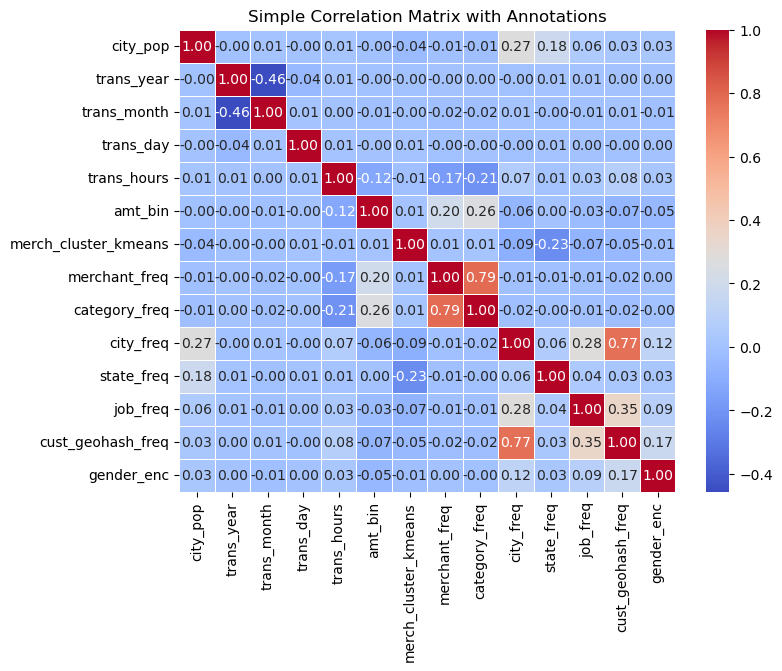

In [303]:
correlation_matrix = sampled_train_df_scaled.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Simple Correlation Matrix with Annotations')
plt.show()

In [304]:
# Removing highly correlated columns
sampled_train_df_scaled.drop(columns=["merchant_freq", "cust_geohash_freq"], axis=1, inplace=True)

In [305]:
sampled_train_df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32000 entries, 0 to 31999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city_pop              32000 non-null  float64
 1   trans_year            32000 non-null  float64
 2   trans_month           32000 non-null  float64
 3   trans_day             32000 non-null  float64
 4   trans_hours           32000 non-null  float64
 5   amt_bin               32000 non-null  float64
 6   merch_cluster_kmeans  32000 non-null  float64
 7   category_freq         32000 non-null  float64
 8   city_freq             32000 non-null  float64
 9   state_freq            32000 non-null  float64
 10  job_freq              32000 non-null  float64
 11  gender_enc            32000 non-null  float64
dtypes: float64(12)
memory usage: 2.9 MB


### PCA

In [306]:
from sklearn.decomposition import PCA

n_components = 10
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(sampled_train_df_scaled)

pca_df = pd.DataFrame(data=X_pca, columns=[f'PC{i+1}' for i in range(n_components)])

print("Principal Components:\n", pca_df.head())

Principal Components:
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  4.562514  1.996036  0.895754  1.571340  0.792875  3.775421  0.601097   
1  0.664288 -0.640191  0.049343  0.479587  0.331396 -0.502981  1.314178   
2  0.715614  1.990220 -0.954935  0.169638  1.545330 -1.147250  0.183355   
3  1.811253 -0.936881 -0.115551 -0.339651  1.026669 -0.703098  0.061552   
4 -1.223164  1.351842  0.344237 -0.056303 -0.176417  0.686015 -0.435613   

        PC8       PC9      PC10  
0 -0.199256 -1.434523  1.880211  
1 -0.638090  0.459886  1.281057  
2  0.371550 -1.329303  1.218178  
3 -0.764527 -1.333472 -0.150944  
4 -0.234550 -0.725042  1.076322  


In [307]:
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio of Each Component:\n", explained_variance_ratio)

Explained Variance Ratio of Each Component:
 [0.13445828 0.12174309 0.11445546 0.09501537 0.08332892 0.08213554
 0.07803587 0.07328311 0.06246252 0.05947777]


In [308]:
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
print("Cumulative Explained Variance Ratio:\n", cumulative_variance_ratio)

Cumulative Explained Variance Ratio:
 [0.13445828 0.25620136 0.37065682 0.46567219 0.54900111 0.63113664
 0.70917252 0.78245562 0.84491814 0.9043959 ]


In [309]:
explained_variance_threshold = 0.80
n_components_to_retain = np.argmax(cumulative_variance_ratio >= explained_variance_threshold) + 1
print(f"Number of components to retain to explain {explained_variance_threshold*100}% variance: {n_components_to_retain}")

Number of components to retain to explain 80.0% variance: 9


In [310]:
pca_final = PCA(n_components=n_components_to_retain)
pca_final = pca_final.fit_transform(sampled_train_df_scaled)
pca_final_df = pd.DataFrame(data=pca_final, columns=[f'PC{i+1}' for i in range(n_components_to_retain)])
print("Final Principal Components (retaining significant variance):\n", pca_final_df.head())

Final Principal Components (retaining significant variance):
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  4.562514  1.996036  0.895754  1.571340  0.792875  3.775421  0.601097   
1  0.664288 -0.640191  0.049343  0.479587  0.331396 -0.502981  1.314178   
2  0.715614  1.990220 -0.954935  0.169638  1.545330 -1.147250  0.183355   
3  1.811253 -0.936881 -0.115551 -0.339651  1.026669 -0.703098  0.061552   
4 -1.223164  1.351842  0.344237 -0.056303 -0.176417  0.686015 -0.435613   

        PC8       PC9  
0 -0.199256 -1.434523  
1 -0.638090  0.459886  
2  0.371550 -1.329303  
3 -0.764527 -1.333472  
4 -0.234550 -0.725042  


## K-Means Clustering

### Determine optimal no. of clusters

Text(0.5, 0, 'Number of Clusters (k)')

Text(0, 0.5, 'Silhouette Score')

Text(0.5, 1.0, 'Silhouette Score for Optimal k')

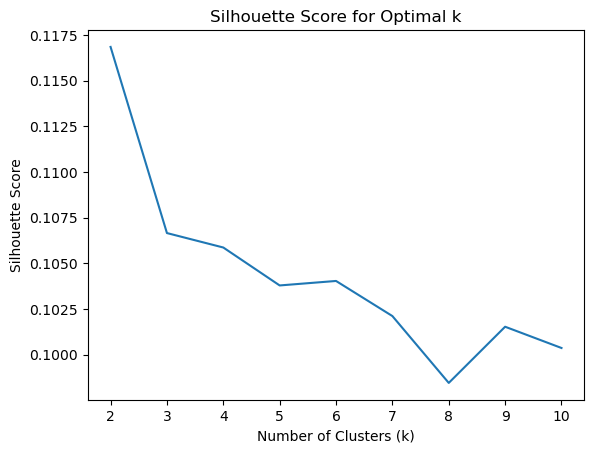

In [311]:
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init="auto")
    # labels = kmeans.fit_predict(sampled_train_df_scaled)
    # silhouette_scores.append(silhouette_score(sampled_train_df_scaled, labels))
    labels = kmeans.fit_predict(pca_final_df)
    silhouette_scores.append(silhouette_score(pca_final_df, labels))

plt.plot(range(2, 11), silhouette_scores)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()

In [312]:
optimal_k = 6

kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init="auto")
# sampled_train_df_scaled['cluster'] = kmeans.fit_predict(sampled_train_df_scaled)
pca_final_df['cluster'] = kmeans.fit_predict(pca_final_df)

In [313]:
pca_final_df['cluster'].unique()

array([5, 1, 0, 3, 2, 4], dtype=int32)

In [314]:
pca_final_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,cluster
0,4.562514,1.996036,0.895754,1.571340,0.792875,3.775421,0.601097,-0.199256,-1.434523,5
1,0.664288,-0.640191,0.049343,0.479587,0.331396,-0.502981,1.314178,-0.638090,0.459886,1
2,0.715614,1.990220,-0.954935,0.169638,1.545330,-1.147250,0.183355,0.371550,-1.329303,0
3,1.811253,-0.936881,-0.115551,-0.339651,1.026669,-0.703098,0.061552,-0.764527,-1.333472,1
4,-1.223164,1.351842,0.344237,-0.056303,-0.176417,0.686015,-0.435613,-0.234550,-0.725042,0


In [315]:
cluster_0 = pca_final_df[pca_final_df['cluster'] == 0]
cluster_1 = pca_final_df[pca_final_df['cluster'] == 1]
cluster_2 = pca_final_df[pca_final_df['cluster'] == 2]
cluster_3 = pca_final_df[pca_final_df['cluster'] == 3]
cluster_4 = pca_final_df[pca_final_df['cluster'] == 4]
cluster_5 = pca_final_df[pca_final_df['cluster'] == 5]


print("Cluster 0 statistics:")
print(cluster_0.describe())
print("\nCluster 1 statistics:")
print(cluster_1.describe())
print("Cluster 2 statistics:")
print(cluster_2.describe())
print("\nCluster 3 statistics:")
print(cluster_3.describe())
print("Cluster 4 statistics:")
print(cluster_4.describe())
print("\nCluster 5 statistics:")
print(cluster_5.describe())

Cluster 0 statistics:
               PC1          PC2          PC3          PC4          PC5  \
count  7163.000000  7163.000000  7163.000000  7163.000000  7163.000000   
mean      0.015608     1.537283    -0.651640     0.097905    -0.001966   
std       0.967031     0.403152     0.861099     1.008089     0.978935   
min      -2.988228     0.168593    -3.988819    -3.570401    -1.830075   
25%      -0.683886     1.231590    -1.183153    -0.577311    -0.846927   
50%       0.014526     1.539703    -0.655361     0.090577    -0.056929   
75%       0.687073     1.847526    -0.101084     0.746220     0.812006   
max       4.186566     2.590389     2.478481     3.534532     2.079347   

               PC6          PC7          PC8          PC9  cluster  
count  7163.000000  7163.000000  7163.000000  7163.000000   7163.0  
mean     -0.014375    -0.067203     0.079209    -0.021084      0.0  
std       0.787722     0.947768     0.997483     0.861945      0.0  
min      -2.194839    -3.186490    

## Plots after K-means clustering

Text(0.5, 1.02, 'Pairwise Scatter Plots of Principal Components (Colored by Cluster)')

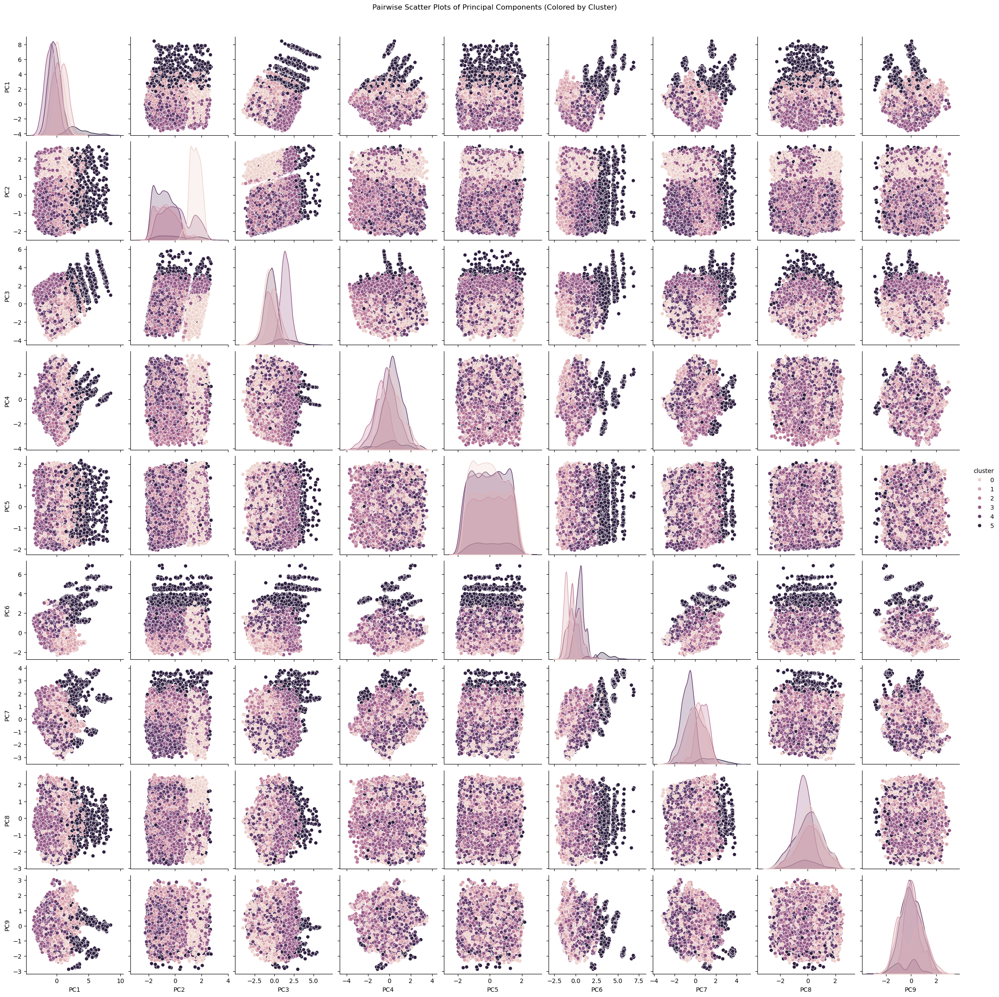

In [316]:
sns.pairplot(pca_final_df, hue='cluster')
plt.suptitle('Pairwise Scatter Plots of Principal Components (Colored by Cluster)', y=1.02)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC1', ylabel='PC2'>

Text(0.5, 1.0, 'Scatter Plot of PC1 vs PC2 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 1 (PC1)')

Text(0, 0.5, 'Principal Component 2 (PC2)')

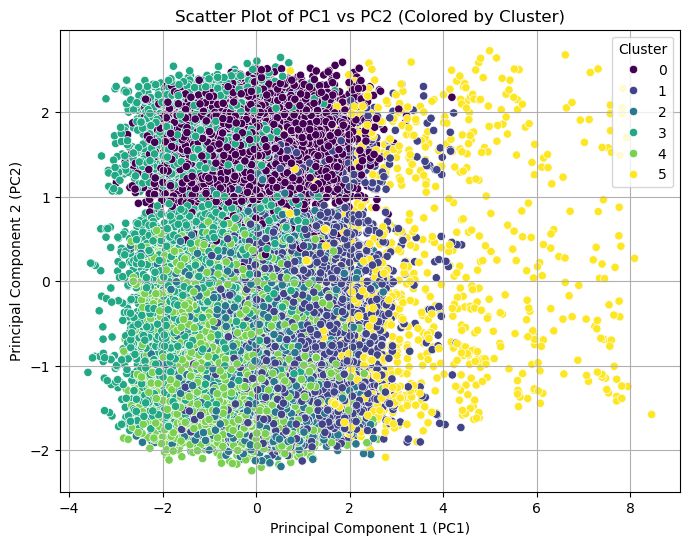

In [317]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC1 vs PC2 (Colored by Cluster)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC1', ylabel='PC3'>

Text(0.5, 1.0, 'Scatter Plot of PC1 vs PC3 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 1 (PC1)')

Text(0, 0.5, 'Principal Component 3 (PC3)')

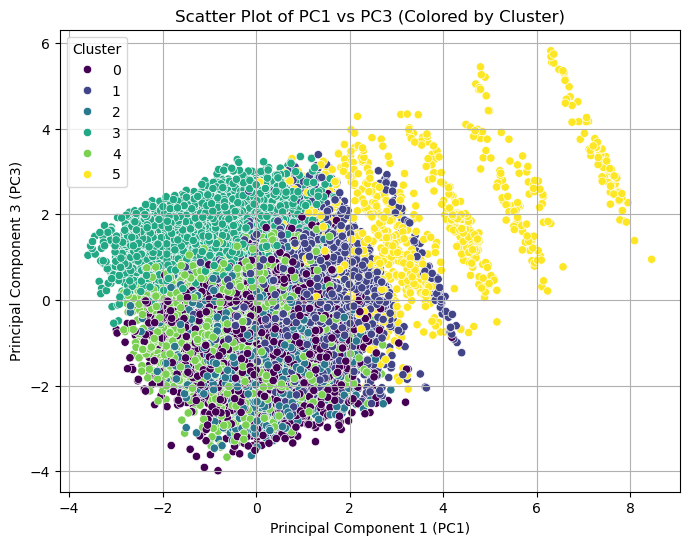

In [318]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC3', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC1 vs PC3 (Colored by Cluster)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 3 (PC3)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC1', ylabel='PC4'>

Text(0.5, 1.0, 'Scatter Plot of PC1 vs PC4 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 1 (PC1)')

Text(0, 0.5, 'Principal Component 4 (PC4)')

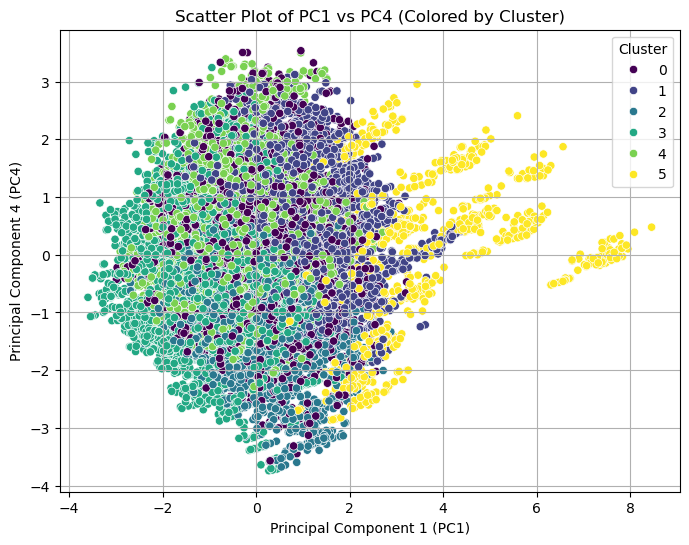

In [319]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC4', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC1 vs PC4 (Colored by Cluster)')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 4 (PC4)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC2', ylabel='PC3'>

Text(0.5, 1.0, 'Scatter Plot of PC2 vs PC3 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 2 (PC2)')

Text(0, 0.5, 'Principal Component 3 (PC3)')

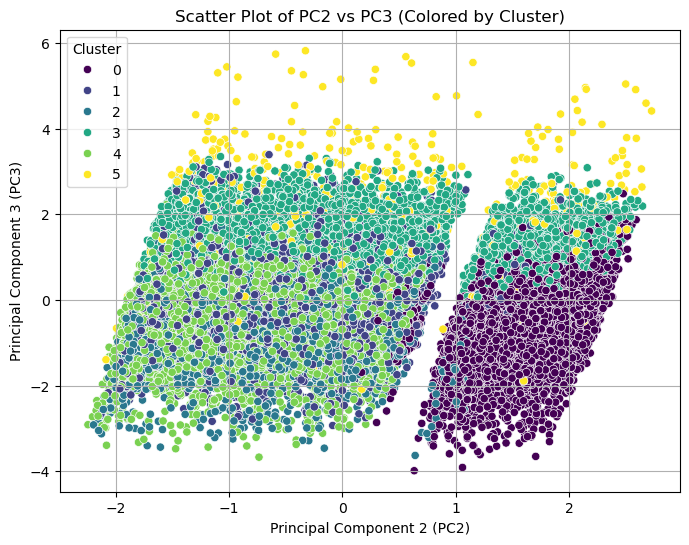

In [320]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC2', y='PC3', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC2 vs PC3 (Colored by Cluster)')
plt.xlabel('Principal Component 2 (PC2)')
plt.ylabel('Principal Component 3 (PC3)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC2', ylabel='PC4'>

Text(0.5, 1.0, 'Scatter Plot of PC2 vs PC4 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 2 (PC2)')

Text(0, 0.5, 'Principal Component 4 (PC4)')

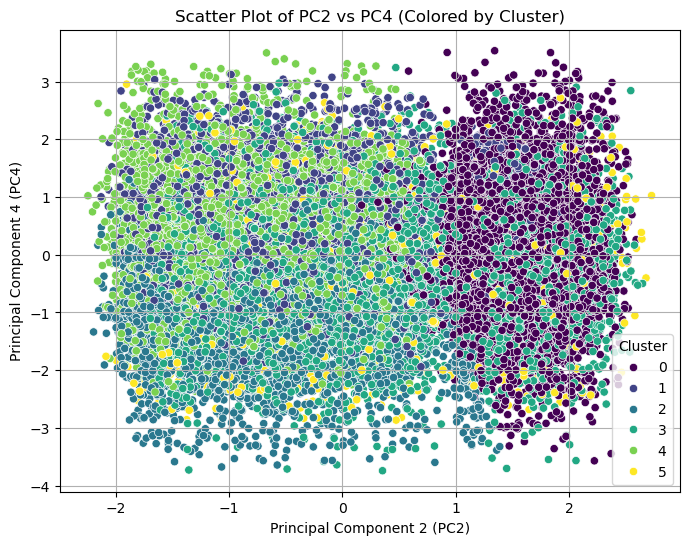

In [321]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC2', y='PC4', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC2 vs PC4 (Colored by Cluster)')
plt.xlabel('Principal Component 2 (PC2)')
plt.ylabel('Principal Component 4 (PC4)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

<Figure size 800x600 with 0 Axes>

<Axes: xlabel='PC3', ylabel='PC4'>

Text(0.5, 1.0, 'Scatter Plot of PC3 vs PC4 (Colored by Cluster)')

Text(0.5, 0, 'Principal Component 3 (PC3)')

Text(0, 0.5, 'Principal Component 4 (PC4)')

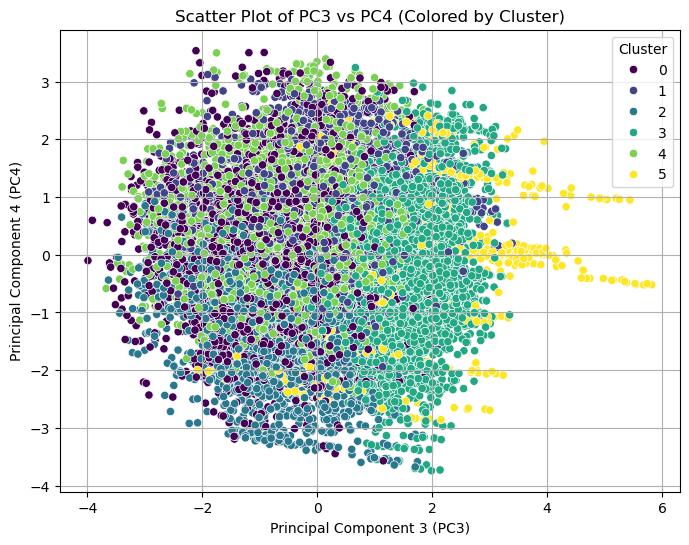

In [322]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC3', y='PC4', hue='cluster', data=pca_final_df, palette='viridis')
plt.title('Scatter Plot of PC3 vs PC4 (Colored by Cluster)')
plt.xlabel('Principal Component 3 (PC3)')
plt.ylabel('Principal Component 4 (PC4)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

## t-SNE Visualization

/home/pavithraselvaraj/conda/envs/cc-env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 't-SNE Visualization of Principal Components (Colored by Cluster)')

Text(0.5, 0, 't-SNE Dimension 1')

Text(0, 0.5, 't-SNE Dimension 2')

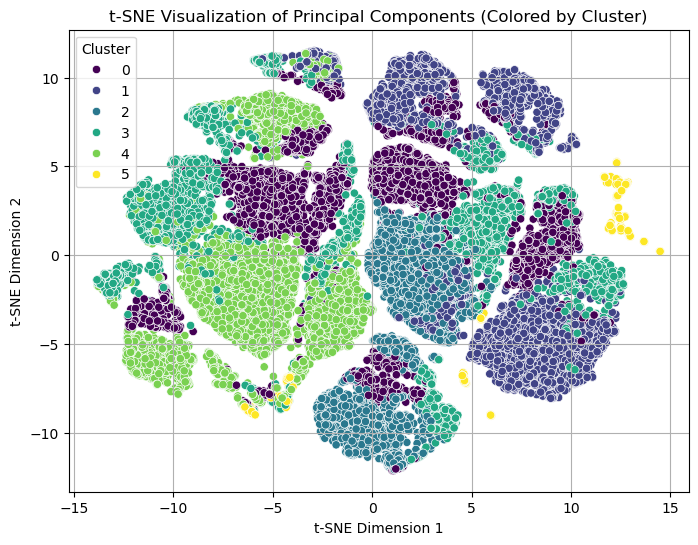

In [323]:
from sklearn.manifold import TSNE

X = pca_final_df[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9']]
y = pca_final_df['cluster']

tsne = TSNE(n_components=2, random_state=42, n_iter=300)
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y, palette='viridis')
plt.title('t-SNE Visualization of Principal Components (Colored by Cluster)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

/home/pavithraselvaraj/conda/envs/cc-env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


<Figure size 800x600 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 't-SNE Visualization of Principal Components (Colored by Cluster)')

Text(0.5, 0, 't-SNE Dimension 1')

Text(0, 0.5, 't-SNE Dimension 2')

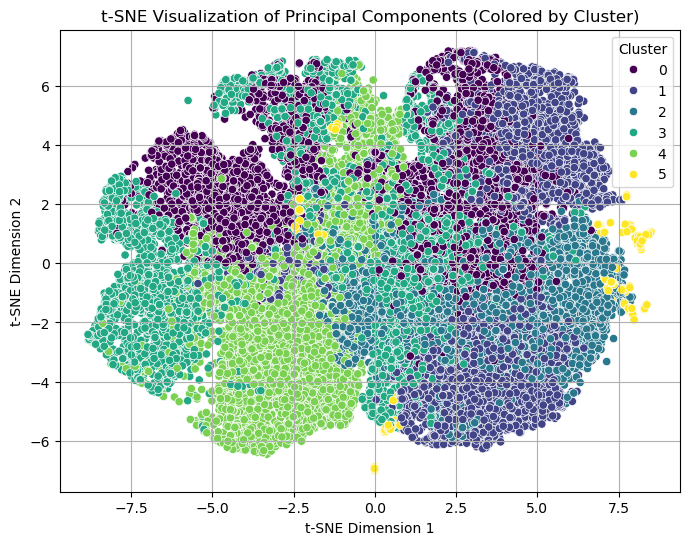

In [324]:
from sklearn.manifold import TSNE

X = pca_final_df[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9']]
y = pca_final_df['cluster']

tsne = TSNE(n_components=3, random_state=42, n_iter=300)
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y, palette='viridis')
plt.title('t-SNE Visualization of Principal Components (Colored by Cluster)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

Text(0.5, 0, 'Principal Component 1 (PC1)')

Text(0.5, 0.5, 'Principal Component 2 (PC2)')

Text(0.5, 0, 'Principal Component 3 (PC3)')

Text(0.5, 0.92, '3D Scatter Plot of PC1, PC2, PC3 (Colored by Cluster)')

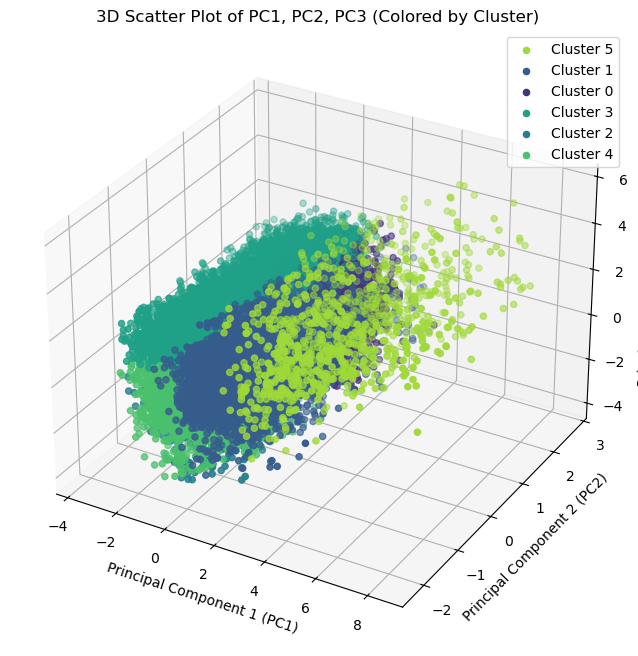

In [325]:
# 3D Scatter plot using first three PCs
n_clusters = pca_final_df['cluster'].nunique()
colors = sns.color_palette('viridis', n_colors=n_clusters)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cluster_id in y.unique():
    subset = pca_final_df[pca_final_df['cluster'] == cluster_id]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'],
               c=[colors[cluster_id]], label=f'Cluster {cluster_id}')

ax.set_xlabel('Principal Component 1 (PC1)')
ax.set_ylabel('Principal Component 2 (PC2)')
ax.set_zlabel('Principal Component 3 (PC3)')
ax.set_title('3D Scatter Plot of PC1, PC2, PC3 (Colored by Cluster)')
ax.legend()
plt.show()

/home/pavithraselvaraj/conda/envs/cc-env/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Text(0.5, 0, 't-SNE Dimension 1')

Text(0.5, 0.5, 't-SNE Dimension 2')

Text(0.5, 0, 't-SNE Dimension 3')

Text(0.5, 0.92, '3D t-SNE Visualization (Colored by Cluster)')

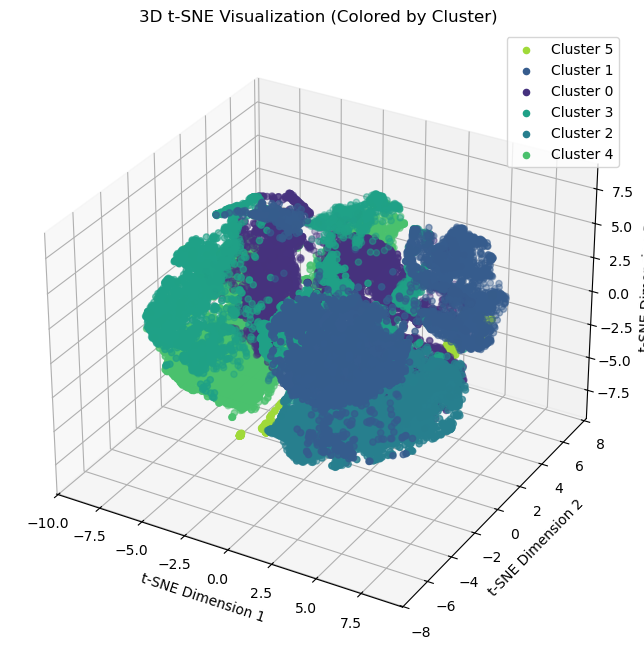

In [326]:
# 3D Scatter plot using t-SNE for dimensionality reduction to 3 components
tsne_3d = TSNE(n_components=3, random_state=42, n_iter=300)
X_tsne_3d = tsne_3d.fit_transform(X)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for cluster_id in y.unique():
    subset_tsne = X_tsne_3d[y == cluster_id]
    ax.scatter(subset_tsne[:, 0], subset_tsne[:, 1], subset_tsne[:, 2],
               c=[colors[cluster_id]], label=f'Cluster {cluster_id}')

ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')
ax.set_title('3D t-SNE Visualization (Colored by Cluster)')
ax.legend()
plt.show()

# Fuzzy clustering

Text(0.5, 0, 'Feature 1')

Text(0, 0.5, 'Feature 2')

Text(0.5, 1.0, 'Fuzzy C-Means Clustering (FPC: 0.29)')

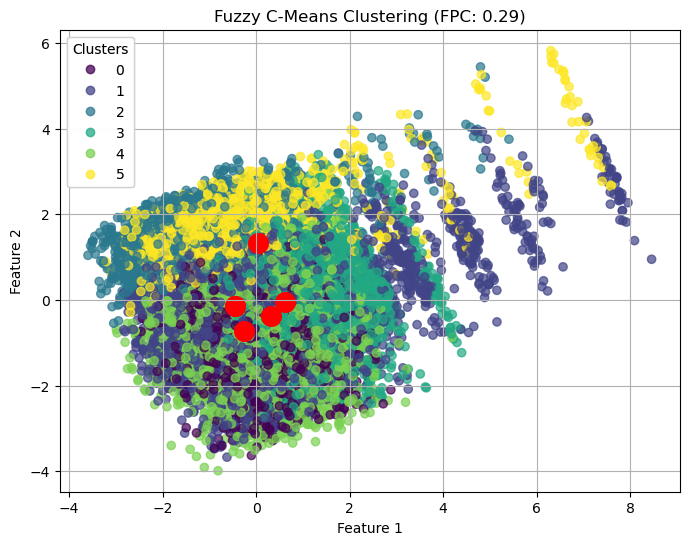

In [327]:
n_fcm_clusters = 6

# Apply fuzzy c-means
cntr, u, u0, d, jm, p, fpc = fuzz.cmeans(
    pca_final_df.T, n_fcm_clusters, 1.5, error=0.005, maxiter=1000, init=None
)

# Predict cluster membership for each data point
cluster_membership = np.argmax(u, axis=0)

# Visualize the results
fig, ax = plt.subplots(figsize=(8, 6))

# Scatter plot of data points, colored by hard cluster assignment
scatter = ax.scatter(pca_final_df['PC1'], pca_final_df['PC3'], c=cluster_membership, cmap='viridis', alpha=0.7)

# Plot cluster centers
ax.scatter(cntr[:, 0], cntr[:, 1], marker='o', s=200, color='red', label='Fuzzy Centers')

# Add labels and title
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.set_title(f"Fuzzy C-Means Clustering (FPC: {fpc:.2f})")
ax.legend()
ax.grid(True)

legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

plt.show()

# Gaussian Mixture Models

In [328]:
pca_final_df.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'cluster'],
      dtype='object')

In [329]:
n_components = 3

gmm_pca_final_df = pca_final_df.drop(columns=['cluster'], axis=1)


In [330]:
gmm_pca_final_df.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9'], dtype='object')

In [ ]:

gmm = GaussianMixture(n_components=n_components, random_state=42)
gmm.fit(gmm_pca_final_df)

cluster_labels = gmm.predict(gmm_pca_final_df)
gmm_pca_final_df['Cluster_gmm'] = cluster_labels 

cluster_probabilities = gmm.predict_proba(gmm_pca_final_df[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9']])

cluster_centers = gmm.means_


<Figure size 1000x800 with 0 Axes>

Text(0.5, 1.0, 'Gaussian Mixture Model with 3 Components')

Text(0.5, 0, 'Feature 1')

Text(0, 0.5, 'Feature 2')

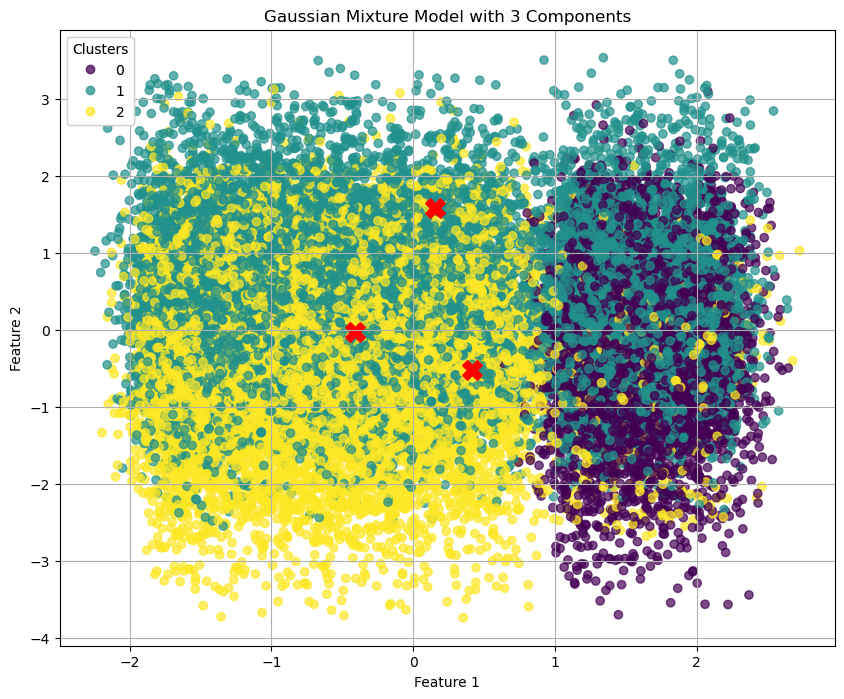

In [337]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(gmm_pca_final_df['PC2'], gmm_pca_final_df['PC4'], c=gmm_pca_final_df['Cluster_gmm'], cmap='viridis', alpha=0.7)

plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], s=200, marker='X', color='red', label='Cluster Centers')

plt.title(f'Gaussian Mixture Model with {n_components} Components')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

plt.grid(True)
plt.show()

## DBSCAN

In [339]:
db_pca_final_df = pca_final_df.drop(columns=['cluster'], axis=1)

In [340]:
db_pca_final_df.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9'], dtype='object')

In [341]:
dbscan = DBSCAN(eps=0.3, min_samples=5)
clusters = dbscan.fit_predict(db_pca_final_df)

In [346]:
unique_clusters = np.unique(clusters)
n_clusters = len(unique_clusters)

/tmp/ipykernel_1299730/1198890735.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


<Figure size 1000x800 with 0 Axes>

Text(0.5, 1.0, 'DBSCAN Clustering')

Text(0.5, 0, 'PC1 (scaled)')

Text(0, 0.5, 'PC3 (scaled)')

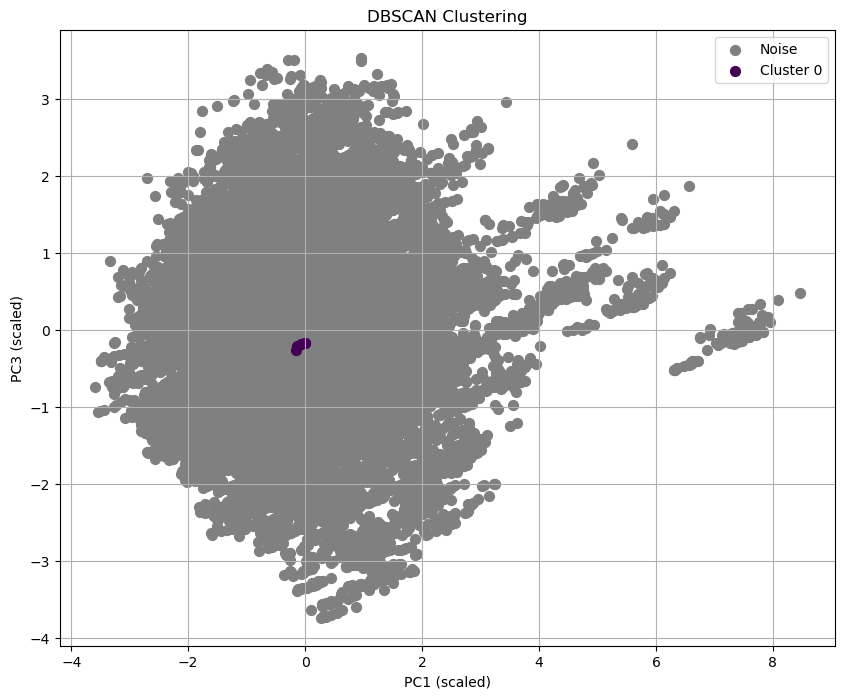

In [349]:
cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)

# Plotting
plt.figure(figsize=(10, 8))

for i, cluster_label in enumerate(unique_clusters):
    cluster_points = db_pca_final_df[clusters == cluster_label]
    if cluster_label == -1:
        # Plot noise points in gray
        plt.scatter(cluster_points['PC1'], cluster_points['PC4'], s=50, color='gray', marker='o', label='Noise')
    else:
        # Plot cluster points with distinct colors from the colormap
        plt.scatter(cluster_points['PC1'], cluster_points['PC4'], s=50, color=cmap(i if -1 not in unique_clusters else i-1), label=f'Cluster {cluster_label}')

plt.title('DBSCAN Clustering')
plt.xlabel('PC1 (scaled)')
plt.ylabel('PC3 (scaled)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()